<a href="https://colab.research.google.com/github/ArifahZhafirah/PCVK26_04_Arifah/blob/main/P3_Week3_04.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# SEL IDENTITAS

In [14]:
# ===== SEL IDENTITAS - JANGAN DIHAPUS, HARUS SEL PERTAMA =====
import sys, platform, hashlib, datetime, zoneinfo
NAMA = 'Arifah Zhafirah Wikananda'
NIM  = '244107020188'

N     = int(NIM[-3:])
PARAM = {
    'b'    : (N % 61) + 20,
    'a'    : round(1.0 + (N % 9) / 10, 1),
    'c'    : (N % 20) + 30,
    'gamma': round(0.4 + (N % 6) * 0.25, 2),
    'bit'  : (N % 6) + 2,
}
waktu = datetime.datetime.now(zoneinfo.ZoneInfo('Asia/Jakarta'))

print('NAMA   :', NAMA)
print('NIM    :', NIM, '| N =', N)
for k, v in PARAM.items():
    print('%-6s :' % k, v)
print('WAKTU  :', waktu.strftime('%Y-%m-%d %H:%M:%S %Z'))
print('SISTEM :', sys.version.split()[0], platform.platform())
kunci = NIM + '|' + waktu.strftime('%Y-%m-%d')
print('TOKEN  :', hashlib.sha256(kunci.encode()).hexdigest()[:16])

NAMA   : Arifah Zhafirah Wikananda
NIM    : 244107020188 | N = 188
b      : 25
a      : 1.8
c      : 38
gamma  : 0.9
bit    : 4
WAKTU  : 2026-09-15 13:09:40 WIB
SISTEM : 3.13.15 Linux-6.6.122+-x86_64-with-glibc2.39
TOKEN  : 568bcab7740ca4e8


#Praktikum

In [15]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


#Transformasi Linier Brightness

Mengubah tingkat kecerahan citra
--------------------------------
Masukkan Nilai Kecerahan: 25


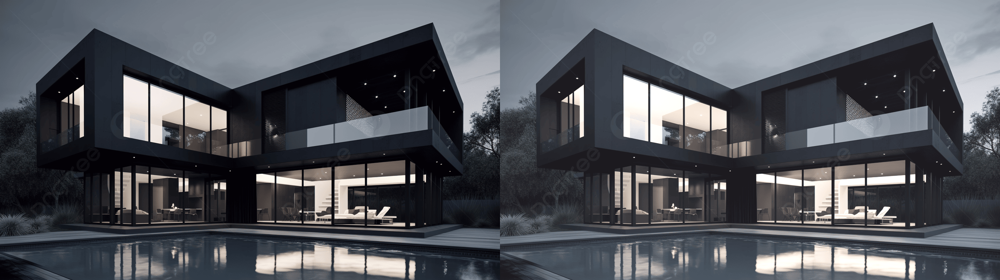

In [16]:
import cv2 as cv
import numpy as np
from google.colab.patches import cv2_imshow

BASE = '/content/drive/MyDrive/Semester5/PCVK/P2_Arifah_04'

print('Mengubah tingkat kecerahan citra')
print('--------------------------------')
try:
    b = int(input('Masukkan Nilai Kecerahan: '))
except ValueError:
    print('Input tidak valid, menggunakan nilai default dari NIM (b =', PARAM['b'], ')')
    b = PARAM['b']

original = cv.imread(BASE + '/rumah.jpg')
if original is None:
    raise FileNotFoundError(f'Gambar tidak ditemukan di: {BASE}/rumah.jpg')

brightness_image = np.clip(original.astype(np.int16) + b, 0, 255).astype(np.uint8)

final_frame = cv.hconcat((original, brightness_image))
cv2_imshow(final_frame)

#TUGAS PRAKTIKUM

1. Implementasikan inverse citra pada Google Colaboratory menggunakan formula pada
bagian Ulasan Teori. Terapkan pada KTM1b.jpg dan KTM1a.jpg, tampilkan
berdampingan dengan citra aslinya. Jelaskan mengapa citra negatif dari KTM1a
(ruangan gelap) tampak pucat dan berkabut, sedangkan negatif dari KTM1b tetap
kontras.

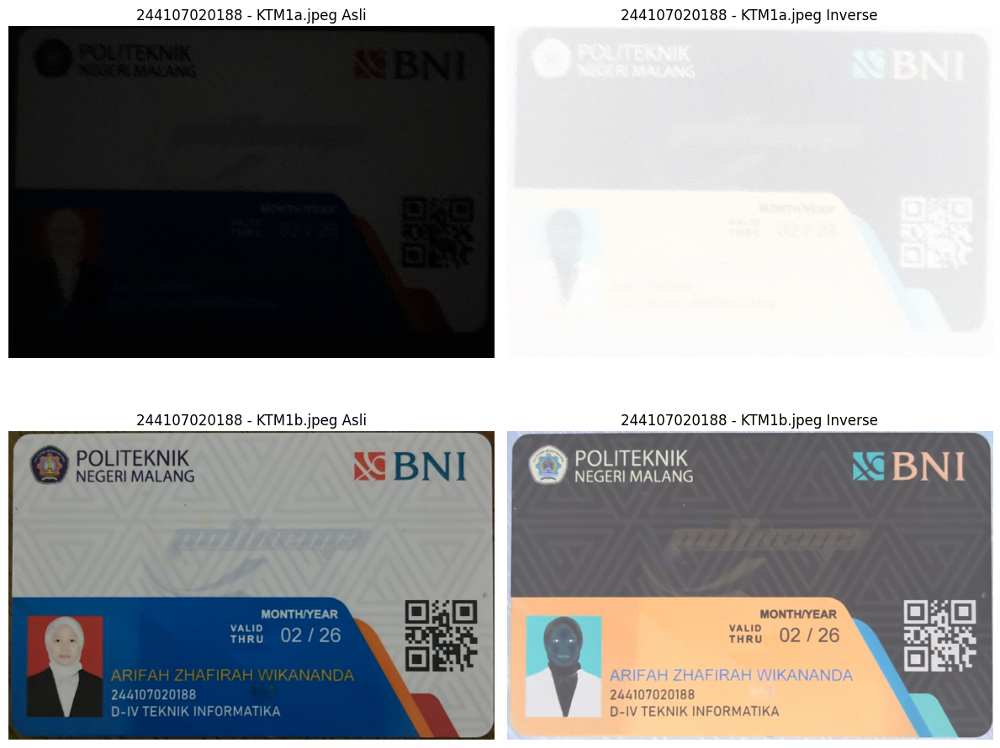

In [17]:
import cv2 as cv
import matplotlib.pyplot as plt

BASE = '/content/drive/MyDrive/Semester5/PCVK/P2_Arifah_04'

def tampilkan(img, judul, ax):
    ax.imshow(cv.cvtColor(img, cv.COLOR_BGR2RGB))
    ax.set_title(NIM + ' - ' + judul)
    ax.axis('off')

fig, axes = plt.subplots(2, 2, figsize=(12, 10))

for i, nama_file in enumerate(['KTM1a.jpeg', 'KTM1b.jpeg']):
    img = cv.imread(BASE + '/' + nama_file)
    if img is None:
        raise FileNotFoundError(f'File tidak ditemukan: {nama_file}')

    inv = 255 - img  # Inverse citra: g(x,y) = 255 - f(x,y)

    tampilkan(img, f'{nama_file} Asli', axes[i, 0])
    tampilkan(inv, f'{nama_file} Inverse', axes[i, 1])

plt.tight_layout()
plt.show()

 2. Implementasikan transformasi kontras dengan nilai a yang dihitung dari NIM Anda (PARAM['a']) pada KTM1a.jpg.

Mengubah kontras dan tingkat kecerahan citra
--------------------------------------------
Masukkan tingkat kecerahan : 25
Masukkan kontras : 1.8


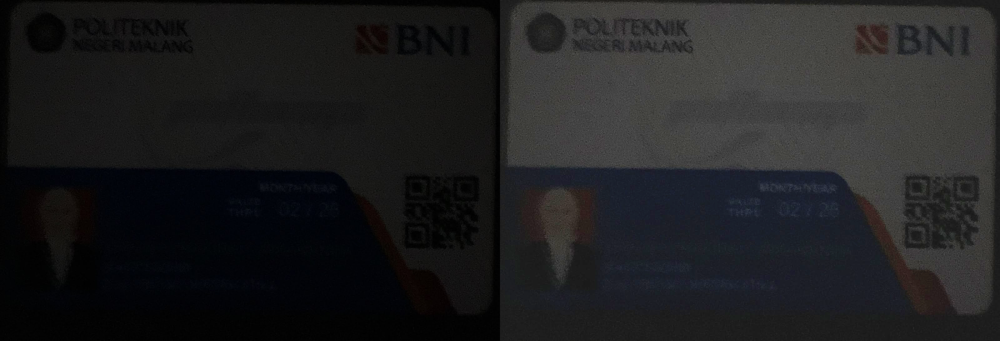

In [20]:
import cv2 as cv
import numpy as np
from google.colab.patches import cv2_imshow

BASE = '/content/drive/MyDrive/Semester5/PCVK/P2_Arifah_04'

print('Mengubah kontras dan tingkat kecerahan citra')
print('--------------------------------------------')

try:
    b = int(input('Masukkan tingkat kecerahan : '))
except ValueError:
    print('Input tidak valid, menggunakan nilai default dari NIM (b =', PARAM['b'], ')')
    b = PARAM['b']

try:
    a = float(input('Masukkan kontras : '))
except ValueError:
    print('Input tidak valid, menggunakan nilai default dari NIM (a =', PARAM['a'], ')')
    a = PARAM['a']

original = cv.imread(BASE + '/KTM1a.jpeg')
if original is None:
    raise FileNotFoundError(f'Gambar tidak ditemukan di: {BASE}/KTM1a.jpeg')

# Transformasi kontras + kecerahan: g(x,y) = a * f(x,y) + b
combined_image = np.clip(original.astype(np.float64) * a + b, 0, 255).astype(np.uint8)

final_frame = cv.hconcat((original, combined_image))
cv2_imshow(final_frame)

3. Implementasikan transformasi logarithmic brightness dengan konstanta c hasil hitung
dari NIM (PARAM['c']) pada KTM1a.jpg. Bandingkan hasilnya dengan linier brightness
memakai nilai b hasil hitung dari NIM (PARAM['b']) pada citra yang sama. Tentukan
metode mana yang membuat NIM pada kartu Anda lebih terbaca, dan tunjukkan
bagian mana yang menjadi putih penuh (clipping) pada masing-masing metode.

Transformasi brightness citra
------------------------------
Masukkan nilai konstanta c: 38
Masukkan nilai kecerahan b: 25


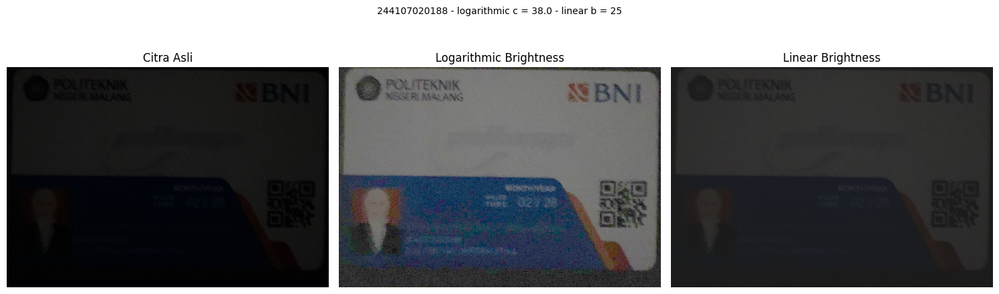

In [21]:
import cv2 as cv
import numpy as np
import matplotlib.pyplot as plt

BASE = '/content/drive/MyDrive/Semester5/PCVK/P2_Arifah_04'

print('Transformasi brightness citra')
print('------------------------------')
try:
    c = float(input('Masukkan nilai konstanta c: '))
except ValueError:
    print('Input tidak valid, menggunakan nilai default dari NIM (c =', PARAM['c'], ')')
    c = PARAM['c']

try:
    b = int(input('Masukkan nilai kecerahan b: '))
except ValueError:
    print('Input tidak valid, menggunakan nilai default dari NIM (b =', PARAM['b'], ')')
    b = PARAM['b']

original = cv.imread(BASE + '/KTM1a.jpeg')
if original is None:
    raise FileNotFoundError(f'Gambar tidak ditemukan di: {BASE}/KTM1a.jpeg')

# Logarithmic brightness: s = c * log(1 + r)
f = original.astype(np.float64)
log_image = np.clip(c * np.log1p(f), 0, 255).astype(np.uint8)

# Linear brightness: g(x,y) = f(x,y) + b
lin_image = np.clip(original.astype(np.int16) + b, 0, 255).astype(np.uint8)

fig, axes = plt.subplots(1, 3, figsize=(15, 5))
fig.suptitle(f'{NIM} - logarithmic c = {c} - linear b = {b}', fontsize=10)

axes[0].imshow(cv.cvtColor(original, cv.COLOR_BGR2RGB)); axes[0].set_title('Citra Asli'); axes[0].axis('off')
axes[1].imshow(cv.cvtColor(log_image, cv.COLOR_BGR2RGB)); axes[1].set_title('Logarithmic Brightness'); axes[1].axis('off')
axes[2].imshow(cv.cvtColor(lin_image, cv.COLOR_BGR2RGB)); axes[2].set_title('Linear Brightness'); axes[2].axis('off')

plt.tight_layout()
plt.show()

4. Implementasikan transformasi grayscale metode averaging, lightness, dan luminance
pada KTM1c.jpg, yaitu citra yang diambil dengan flash. Hitung rata-rata dan
simpangan baku intensitas hasil ketiga metode, sajikan dalam satu tabel, lalu tentukan
metode mana yang memberi pemisahan paling jelas antara teks dan latar kartu.

Metode       Rata-rata    Std       
Averaging    178.22       59.11     
Lightness    179.10       59.18     
Luminance    172.97       62.23     


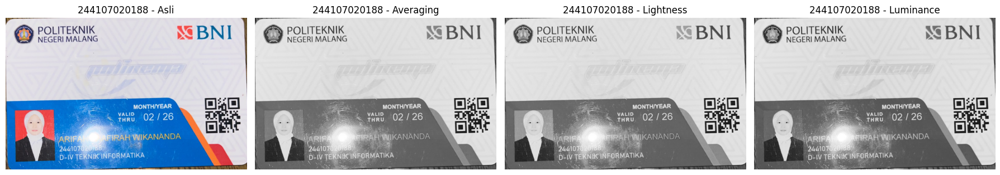

In [22]:
BASE = '/content/drive/MyDrive/Semester5/PCVK/P2_Arifah_04'
ktm1c = cv.imread(BASE + '/KTM1c.jpeg')
if ktm1c is None:
    raise FileNotFoundError(f'Gambar tidak ditemukan di: {BASE}/KTM1c.jpeg')

B, G, R = cv.split(ktm1c.astype(np.float64))  # OpenCV format BGR

grayscale = {
    'Averaging': (R + G + B) / 3,
    'Lightness': (np.maximum.reduce([R,G,B]) + np.minimum.reduce([R,G,B])) / 2,
    'Luminance': 0.21*R + 0.72*G + 0.07*B,
}

fig, axes = plt.subplots(1, 4, figsize=(18, 5))
axes[0].imshow(cv.cvtColor(ktm1c, cv.COLOR_BGR2RGB)); axes[0].set_title(NIM + ' - Asli'); axes[0].axis('off')

print(f"{'Metode':<12} {'Rata-rata':<12} {'Std':<10}")
for i, (nama, hasil) in enumerate(grayscale.items(), start=1):
    hasil = hasil.astype(np.uint8)
    axes[i].imshow(hasil, cmap='gray'); axes[i].set_title(f'{NIM} - {nama}'); axes[i].axis('off')
    print(f"{nama:<12} {hasil.mean():<12.2f} {hasil.std():<10.2f}")

plt.tight_layout()
plt.show()

5. Tampilkan satu warna tertentu pada citra dan ubah bagian lainnya menjadi grayscale.
Gunakan OBJ1.jpg, yaitu foto benda milik Anda sendiri dengan satu warna dominan.
Sebutkan rentang nilai HSV yang Anda pakai sebagai batas warna, lalu tunjukkan
pengaruhnya apabila rentang tersebut diperlebar dan dipersempit.

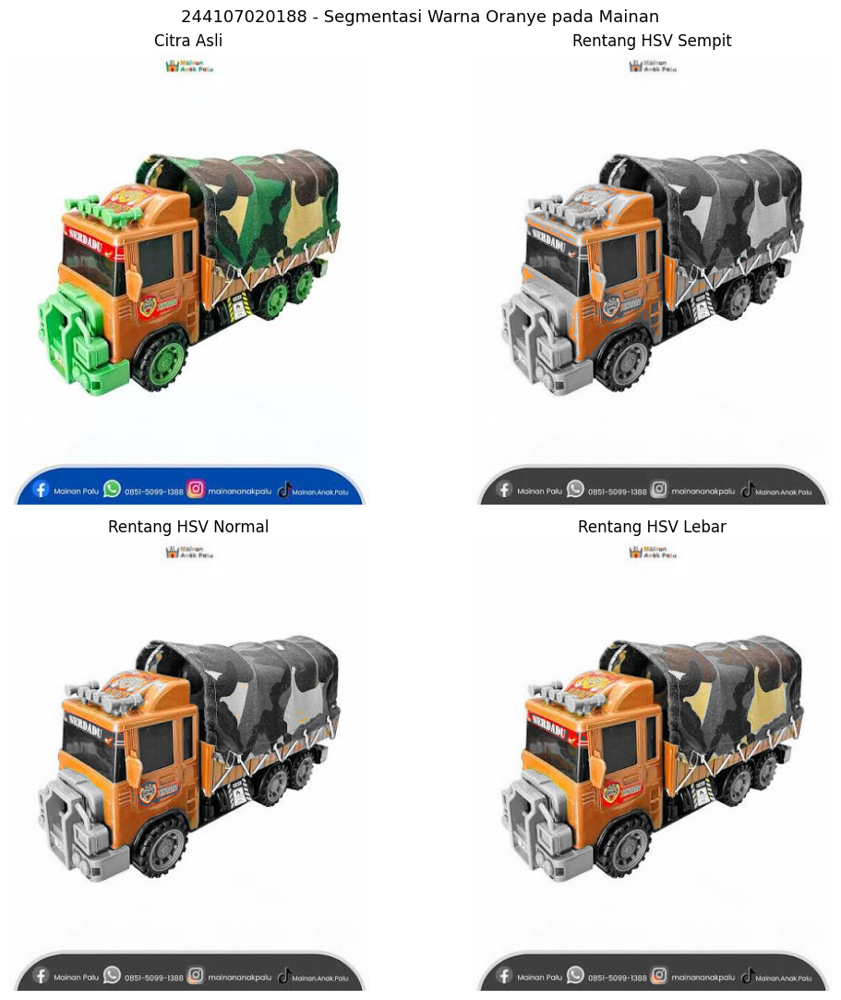

In [23]:
BASE = '/content/drive/MyDrive/Semester5/PCVK/P2_Arifah_04'
obj1 = cv.imread(BASE + '/mainan.jpeg')
if obj1 is None:
    raise FileNotFoundError(f'Gambar tidak ditemukan di: {BASE}/mainan.jpeg')

hsv = cv.cvtColor(obj1, cv.COLOR_BGR2HSV)
gray_3ch = cv.cvtColor(cv.cvtColor(obj1, cv.COLOR_BGR2GRAY), cv.COLOR_GRAY2BGR)

def buat_hasil(lower, upper):
    mask = cv.inRange(hsv, np.array(lower), np.array(upper))
    color_part = cv.bitwise_and(obj1, obj1, mask=mask)
    gray_part = cv.bitwise_and(gray_3ch, gray_3ch, mask=cv.bitwise_not(mask))
    return cv.add(color_part, gray_part)

# Rentang HSV warna oranye (hasil sampling pada kabin mainan)
rentang = {
    'Citra Asli': None,
    'Rentang HSV Sempit': ([8, 130, 150], [15, 255, 255]),
    'Rentang HSV Normal': ([5, 80, 100],  [20, 255, 255]),
    'Rentang HSV Lebar':  ([0, 40, 60],   [30, 255, 255]),
}

fig, axes = plt.subplots(2, 2, figsize=(11, 11))
fig.suptitle(f'{NIM} - Segmentasi Warna Oranye pada Mainan', fontsize=13)

for ax, (judul, batas) in zip(axes.flat, rentang.items()):
    citra = obj1 if batas is None else buat_hasil(*batas)
    ax.imshow(cv.cvtColor(citra, cv.COLOR_BGR2RGB))
    ax.set_title(judul)
    ax.axis('off')

plt.tight_layout()
plt.show()

6. Nilai gamma diminta dari pengguna melalui kode di bawah ini. Lanjutkan kode tersebut
sesuai rumus pada Ulasan Teori, kemudian terapkan pada KTM1a.jpg. Mulailah dari nilai
gamma hasil hitung dari NIM Anda, lalu cari secara bertahap nilai gamma yang membuat
NIM dan nama pada kartu paling terbaca

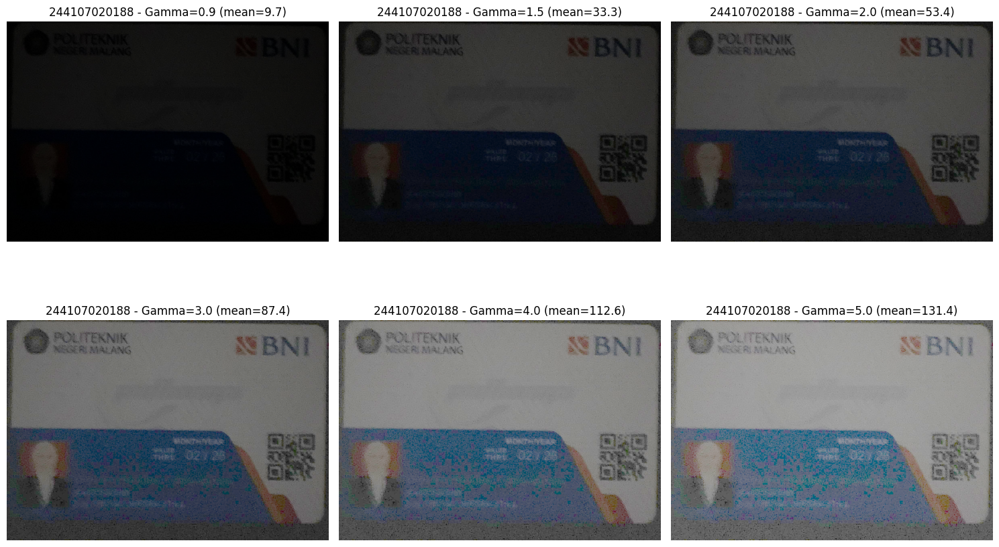

Gamma=0.9   | Rata-rata: 9.74
Gamma=1.5   | Rata-rata: 33.29
Gamma=2.0   | Rata-rata: 53.36
Gamma=3.0   | Rata-rata: 87.38
Gamma=4.0   | Rata-rata: 112.57
Gamma=5.0   | Rata-rata: 131.44


In [33]:
BASE = '/content/drive/MyDrive/Semester5/PCVK/P2_Arifah_04'
ktm1a = cv.imread(BASE + '/KTM1a.jpeg')
if ktm1a is None:
    raise FileNotFoundError(f'Gambar tidak ditemukan di: {BASE}/KTM1a.jpeg')

fig.suptitle(f'{NIM} - Gamma Correction pada citra', fontsize=13)

def gamma_correction(img, gamma):
    # I' = 255 * (I/255)^(1/gamma)
    f = img.astype(np.float64) / 255.0
    corrected = 255 * (f ** (1.0 / gamma))
    return np.clip(corrected, 0, 255).astype(np.uint8)

# Coba beberapa nilai gamma, mulai dari hasil NIM lalu naik bertahap
gamma_list = [PARAM['gamma'], 1.5, 2.0, 3.0, 4.0, 5.0]

fig, axes = plt.subplots(2, 3, figsize=(15, 10))
for ax, g in zip(axes.flat, gamma_list):
    hasil = gamma_correction(ktm1a, g)
    ax.imshow(cv.cvtColor(hasil, cv.COLOR_BGR2RGB))
    ax.set_title(f'{NIM} - Gamma={g} (mean={hasil.mean():.1f})')
    ax.axis('off')
plt.tight_layout()
plt.show()

for g in gamma_list:
    hasil = gamma_correction(ktm1a, g)
    print(f'Gamma={g:<5} | Rata-rata: {hasil.mean():.2f}')

7. Percobaan ini digunakan sebagai simulasi dari proses kuantisasi citra. Pada kuantisasi
citra, pixel dapat direpresentasikan dengan n-bit kedalaman (default menggunakan 8-bit).
Pada pixel 8-bit, warna yang memungkinkan adalah 256 warna, dari 0 (0000 0000) hingga
255(1111 1111). Pada pixel 7-bit, warna yang memungkinkan adalah 128 warna, dari 0
(000 0000) hingga 127 (111 1111). Kemungkinan warna didapat dari pangkat 2 jumlah bit.
Jika 7bit, maka jumlah warnanya adalah 27 = 128, dst.

1-bit: mean=148.99
2-bit: mean=120.05
3-bit: mean=104.32
4-bit: mean=110.75
5-bit: mean=111.39
6-bit: mean=111.30
7-bit: mean=111.31


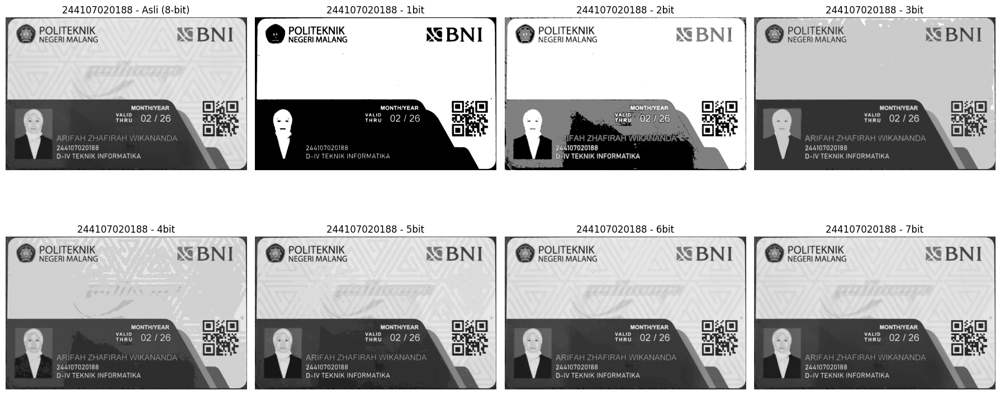

In [40]:
BASE = '/content/drive/MyDrive/Semester5/PCVK/P2_Arifah_04'
ktm1b = cv.imread(BASE + '/KTM1b.jpeg', cv.IMREAD_GRAYSCALE)
if ktm1b is None:
    raise FileNotFoundError(f'Gambar tidak ditemukan di: {BASE}/KTM1b.jpeg')

def simulasi_depth(img, bit_depth):
    level = 255 / (2**bit_depth - 1)
    hasil = np.round(img / level) * level
    return hasil.astype(np.uint8)

fig, axes = plt.subplots(2, 4, figsize=(18, 9))
axes = axes.flat
axes[0].imshow(ktm1b, cmap='gray')
axes[0].set_title(NIM + ' - Asli (8-bit)')
axes[0].axis('off')

for i, bit in enumerate(range(1, 8), start=1):
    hasil = simulasi_depth(ktm1b, bit)
    n_warna = 2**bit
    axes[i].imshow(hasil, cmap='gray')
    axes[i].set_title(f'{NIM} - {bit}bit')
    axes[i].axis('off')
    print(f'{bit}-bit: mean={hasil.mean():.2f}')

plt.tight_layout()
plt.show()

8. Buat modul average denoising sesuai dengan rumus yang telah diberikan pada sub bab
sebelumnya.  
Citra asli sudah disediakan pada /images/galaxy.jpg.
100 Citra dengan Gaussian Noise sudah disediakan pada /images/noises/*.jpg
Anda dapat menggunakan code berikut untuk membaca semua image dalam satu folder ,
gunakan modul glob (import glob).

Jumlah citra noisy terbaca: 100
Citra=10   PSNR=19.74 dB
Citra=20   PSNR=19.84 dB
Citra=40   PSNR=19.89 dB
Citra=80   PSNR=19.92 dB
Citra=100  PSNR=19.92 dB


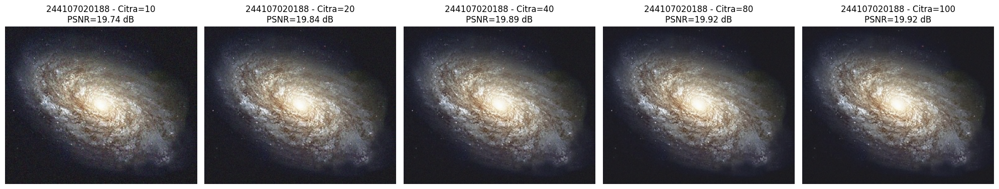

In [46]:
import glob
from math import log10, sqrt

def PSNR(img1, img2):
    img1 = img1.astype(np.float64)
    img2 = img2.astype(np.float64)
    mse = np.mean((img1 - img2) ** 2)
    if mse == 0:
        return float('inf')
    return 20 * log10(255.0 / sqrt(mse))

BASE = '/content/drive/MyDrive/Semester5/PCVK/P2_Arifah_04'
original = cv.imread(BASE + '/galaxy.jpg')

cv_img = []
for f in sorted(glob.glob(BASE + '/noises/*.jpg')):
    cv_img.append(cv.imread(f))
print('Jumlah citra noisy terbaca:', len(cv_img))

def average_denoise(img_list, n):
    subset = img_list[:n]
    stacked = np.stack(subset, axis=0).astype(np.float64)
    return np.clip(np.mean(stacked, axis=0), 0, 255).astype(np.uint8)

jumlah_list = [10, 20, 40, 80, 100]
hasil_list, psnr_list = [], []

for n in jumlah_list:
    hasil = average_denoise(cv_img, n)
    psnr = PSNR(original, hasil)
    hasil_list.append(hasil)
    psnr_list.append(psnr)
    print(f'Citra={n:<4} PSNR={psnr:.2f} dB')

fig, axes = plt.subplots(1, 5, figsize=(20, 4))
for ax, n, hasil, psnr in zip(axes, jumlah_list, hasil_list, psnr_list):
    ax.imshow(cv.cvtColor(hasil, cv.COLOR_BGR2RGB))
    ax.set_title(f'{NIM} - Citra={n}\nPSNR={psnr:.2f} dB')
    ax.axis('off')
plt.tight_layout()
plt.show()

9.Buat mask biner Anda sendiri yang menutup area foto wajah dan area NIM pada
KTM1d.jpg, lalu gabungkan dengan citra menggunakan operator AND sehingga kedua
area tersebut tersamarkan. Tuliskan koordinat kotak mask yang Anda pakai.

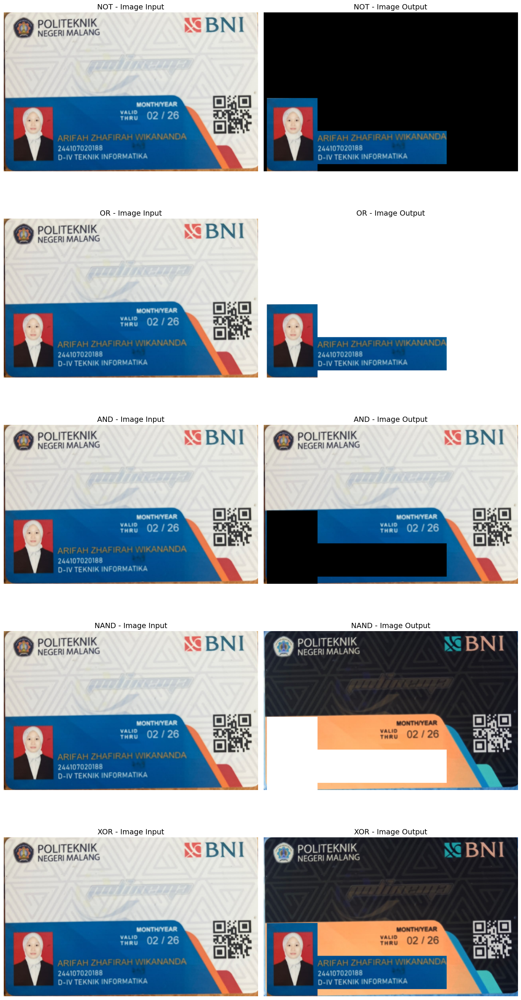

In [77]:
h, w = ktm1d.shape[:2]

box_wajah = (16, 432, 270, 850)
box_nim   = (100, 597, 920, 763)

# Mask dasar: 0 di area wajah/NIM, 255 di luar (definisi dibalik dari sebelumnya)
mask_area_privasi = np.zeros((h, w), dtype=np.uint8)
cv.rectangle(mask_area_privasi, (box_wajah[0], box_wajah[1]), (box_wajah[2], box_wajah[3]), 255, -1)
cv.rectangle(mask_area_privasi, (box_nim[0], box_nim[1]), (box_nim[2], box_nim[3]), 255, -1)
mask = cv.bitwise_not(mask_area_privasi)
mask_3ch = cv.cvtColor(mask, cv.COLOR_GRAY2BGR)

hasil_not  = cv.bitwise_and(ktm1d, ktm1d, mask=cv.bitwise_not(mask))
hasil_or   = cv.bitwise_or(ktm1d, mask_3ch)
hasil_and  = cv.bitwise_and(ktm1d, ktm1d, mask=mask)
hasil_nand = cv.bitwise_not(hasil_and)
hasil_xor  = cv.bitwise_xor(ktm1d, mask_3ch)

operator_list = [
    ('NOT', hasil_not),
    ('OR', hasil_or),
    ('AND', hasil_and),
    ('NAND', hasil_nand),
    ('XOR', hasil_xor),
]

fig, axes = plt.subplots(5, 2, figsize=(14, 28))
for i, (nama_op, hasil) in enumerate(operator_list):
    axes[i,0].imshow(cv.cvtColor(ktm1d, cv.COLOR_BGR2RGB))
    axes[i,0].set_title(f'{nama_op} - Image Input', fontsize=14)
    axes[i,0].axis('off')
    axes[i,1].imshow(cv.cvtColor(hasil, cv.COLOR_BGR2RGB))
    axes[i,1].set_title(f'{nama_op} - Image Output', fontsize=14)
    axes[i,1].axis('off')
plt.tight_layout()
plt.show()

Analisa:

Perbedaan hasil kelima operator ini disebabkan cara masing-masing menggabungkan nilai pixel citra dengan nilai mask (0 atau 255). Karena mask yang dipakai bernilai 0 di area wajah/NIM dan 255 di luar area itu:

-NOT membalik mask dulu sebelum di-AND, jadi cuma wajah+NIM yang kelihatan, sisanya hitam.

-OR bikin area luar wajah/NIM jadi putih semua (255 OR apapun = 255), sedangkan area wajah/NIM tetap asli karena OR dengan 0 tidak mengubah nilai.

-AND kebalikannya — area luar tetap asli, tapi wajah/NIM jadi hitam. Ini yang dipakai buat nutup data pribadi karena hasilnya paling pas.

-NAND tinggal komplemen dari AND, jadi warnanya kebalik semua (area yang tadi asli jadi negatif, yang tadi hitam jadi putih).

-XOR membalik warna di area luar wajah/NIM jadi negatif, tapi area wajah/NIM tidak berubah karena di-XOR dengan 0.

10. Carilah foto malam hari yang gelap. Namun, beberapa bagian gambar memiliki detail yang
sebenarnya cukup baik. Pilih salah satu metode berikut dan implementasikan pada foto
tersebut (Linear Brightness, Contrast, Logarithmic Brightness, Gamma Correction). Sebutkan
alasan dan resiko metode yang Anda gunakan.

Masukkan nilai gamma: 0.6
Rata-rata sebelum: 34.26
Rata-rata sesudah: 63.72


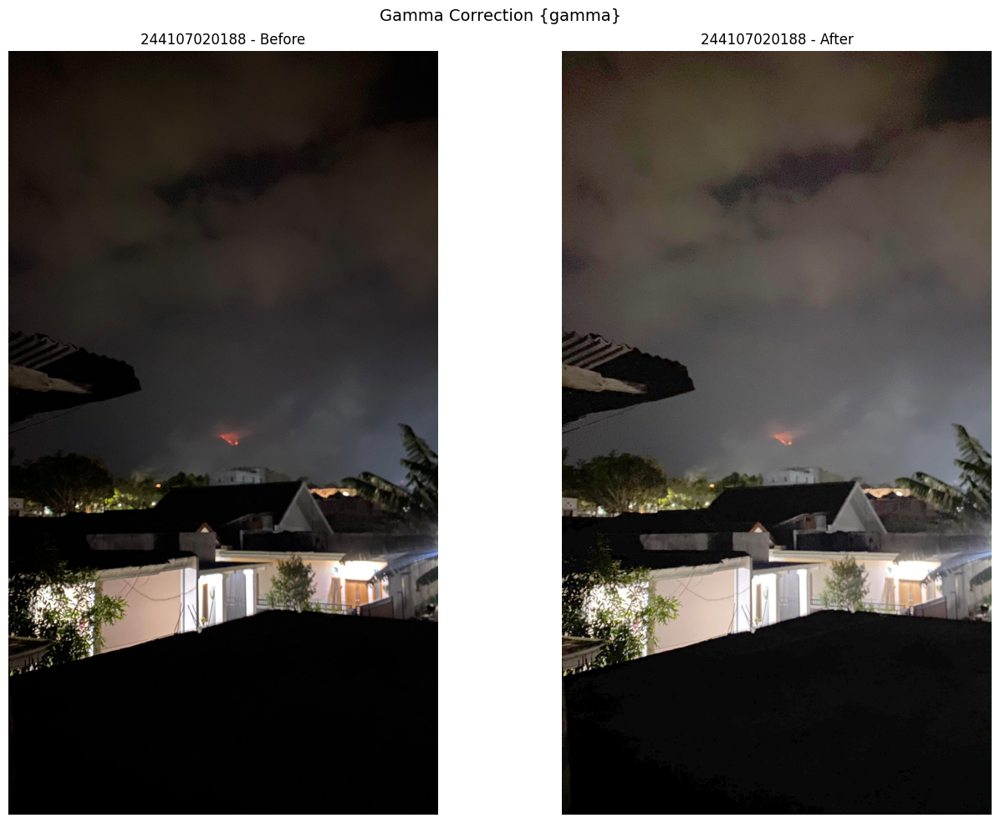

In [93]:
BASE = '/content/drive/MyDrive/Semester5/PCVK/P2_Arifah_04'
img = cv.imread(BASE + '/potret.jpeg')
if img is None:
    raise FileNotFoundError(f'Gambar tidak ditemukan di: {BASE}/potret.jpeg')

try:
    gamma = float(input('Masukkan nilai gamma: '))
except ValueError:
    gamma = 0.5
    print('Input tidak valid, menggunakan nilai default (gamma = 0.5)')

hasil = np.clip(255 * (img / 255.0) ** gamma, 0, 255).astype(np.uint8)
print('Rata-rata sebelum:', round(img.mean(), 2))
print('Rata-rata sesudah:', round(hasil.mean(), 2))

fig, axes = plt.subplots(1, 2, figsize=(14, 10))
fig.suptitle('Gamma Correction {gamma}', fontsize=14)
for ax, gambar, judul in zip(axes, [img, hasil], ['Before', 'After']):
    ax.imshow(cv.cvtColor(gambar, cv.COLOR_BGR2RGB))
    ax.set_title(f'{NIM} - {judul}')
    ax.axis('off')
plt.tight_layout()
plt.show()

Alasan pemilihan: Foto malam ini punya lebih dari setengah pixel-nya (52,9%) sangat gelap (<30), tapi juga ada beberapa titik terang (lampu rumah, pijaran kemerahan di langit) yang sudah mendekati 255. Kalau dipakai Linear Brightness, seluruh citra digeser rata termasuk area yang sudah terang, sehingga berisiko clipping (kehilangan detail) di titik-titik terang tersebut. Gamma Correction dengan γ<1 punya sifat "non-linear" mengangkat nilai gray level rendah jauh lebih agresif dibanding nilai yang sudah tinggi, sehingga detail di area gelap (tekstur awan, siluet atap) bisa terangkat tanpa terlalu mengganggu area yang sudah terang.